In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
# 1a. Install dependencies
!pip install -q ultralytics opencv-python albumentations

# 1b. Clone the official repo
!git clone -q https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -q -r requirements.txt


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 79.9 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 whic

In [3]:
!find /kaggle/input/smoke-fire-detection-yolo -maxdepth 2 | sed -e 's/^/   /g'



   /kaggle/input/smoke-fire-detection-yolo
   /kaggle/input/smoke-fire-detection-yolo/data.yaml
   /kaggle/input/smoke-fire-detection-yolo/data
   /kaggle/input/smoke-fire-detection-yolo/data/val
   /kaggle/input/smoke-fire-detection-yolo/data/test
   /kaggle/input/smoke-fire-detection-yolo/data/train


In [6]:
%%bash
sed -n '1,20p' /kaggle/input/smoke-fire-detection-yolo/data.yaml


path: /kaggle/working/D Fire Dataset  # dataset root dir
train: data/train/images  # train images (relative to 'path')
val: data/val/images  # val images (relative to 'path')
test: data/test/images  # test images (relative to 'path')

# Classes
names: ['smoke', 'fire']  # Replace with your actual class names

# Counts
nc: 2  # number of classes
train_count: 14122
val_count: 3099
test_count: 4306


In [7]:
%%bash
find /kaggle/input/smoke-fire-detection-yolo/data/train -maxdepth 2 | sed 's|^|   |g'


   /kaggle/input/smoke-fire-detection-yolo/data/train
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/PublicDataset00021.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/WEB07573.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/WEB05039.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/WEB04527.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/AoF05036.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/AoF03680.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/AoF02858.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/WEB05950.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/WEB04211.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/AoF05672.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/WEB08362.txt
   /kaggle/input/smoke-fire-detection-yolo/data/train/labels/

In [8]:
%%bash
cat << 'EOF' > data.yaml
train: /kaggle/input/smoke-fire-detection-yolo/data/train/images
val:   /kaggle/input/smoke-fire-detection-yolo/data/val/images
test:  /kaggle/input/smoke-fire-detection-yolo/data/test/images

nc: 2
names: ['smoke','fire']
EOF

echo "== data.yaml =="
cat data.yaml


== data.yaml ==
train: /kaggle/input/smoke-fire-detection-yolo/data/train/images
val:   /kaggle/input/smoke-fire-detection-yolo/data/val/images
test:  /kaggle/input/smoke-fire-detection-yolo/data/test/images

nc: 2
names: ['smoke','fire']


In [9]:
!python train.py \
  --img 640 \
  --batch 16 \
  --epochs 50 \
  --data data.yaml \
  --cfg models/yolov5m.yaml \
  --weights yolov5m.pt \
  --name smoke_fire_v5m


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-04-29 16:23:11.170328: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745943791.655638     140 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745943791.786173     140 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS wh

In [16]:
%load_ext tensorboard
%tensorboard --logdir runs/train/smoke_fire_v5m


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 101480), started 0:16:10 ago. (Use '!kill 101480' to kill it.)

<IPython.core.display.Javascript object>

In [17]:
!python val.py \
  --weights runs/train/smoke_fire_v5m/weights/best.pt \
  --data data.yaml \
  --img 640


val: data=data.yaml, weights=['runs/train/smoke_fire_v5m/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /kaggle/input/smoke-fire-detection-yolo/data/val/labels... 3094 im
val: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07535.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07535.jpg'
val: WARNING ⚠️ /kaggle/input/smoke-fire-detection-yolo/data/val/images/WEB07536.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/ka

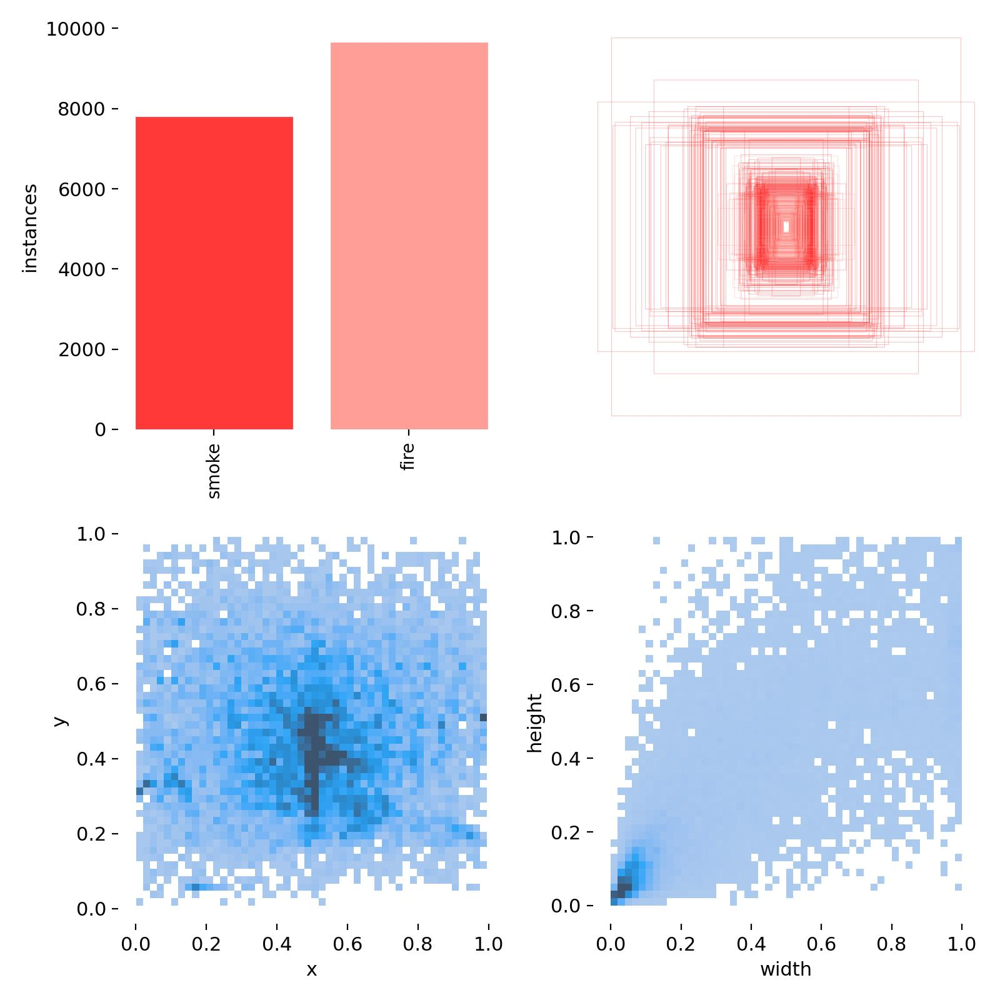

In [19]:
from PIL import Image
from IPython.display import display

display(Image.open('runs/train/smoke_fire_v5m/labels.jpg'))


In [20]:
!python detect.py \
  --weights runs/train/smoke_fire_v5m/weights/best.pt \
  --img 640 \
  --source /kaggle/input/smoke-fire-detection-yolo/data/test/images \
  --save-txt \
  --project inference_v5m \
  --name test_results


detect: weights=['runs/train/smoke_fire_v5m/weights/best.pt'], source=/kaggle/input/smoke-fire-detection-yolo/data/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=inference_v5m, name=test_results, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20856975 parameters, 0 gradients, 47.9 GFLOPs
image 1/4306 /kaggle/input/smoke-fire-detection-yolo/data/test/images/AoF06723.jpg: 384x640 (no detections), 49.2ms
image 2/4306 /kaggle/input/smoke-fire-detection-yolo/data/test/images/AoF06724.jpg: 352x640 (no detections), 34.3ms
image 3/4306 /kaggle/

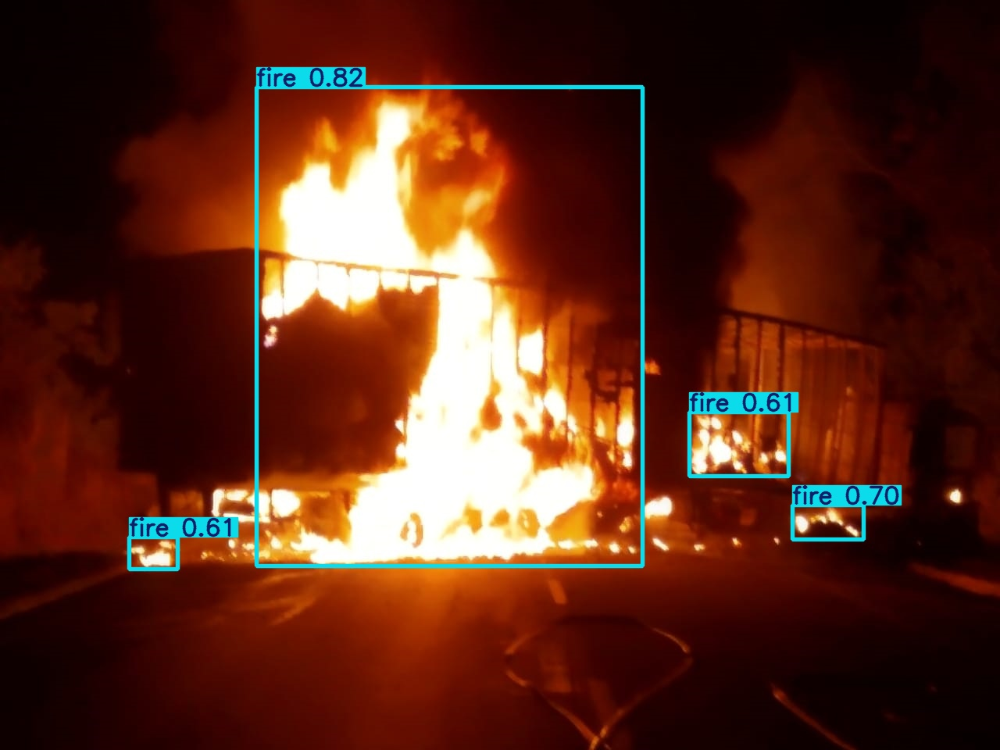

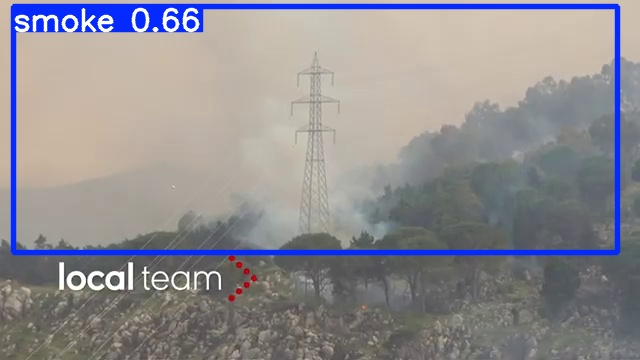

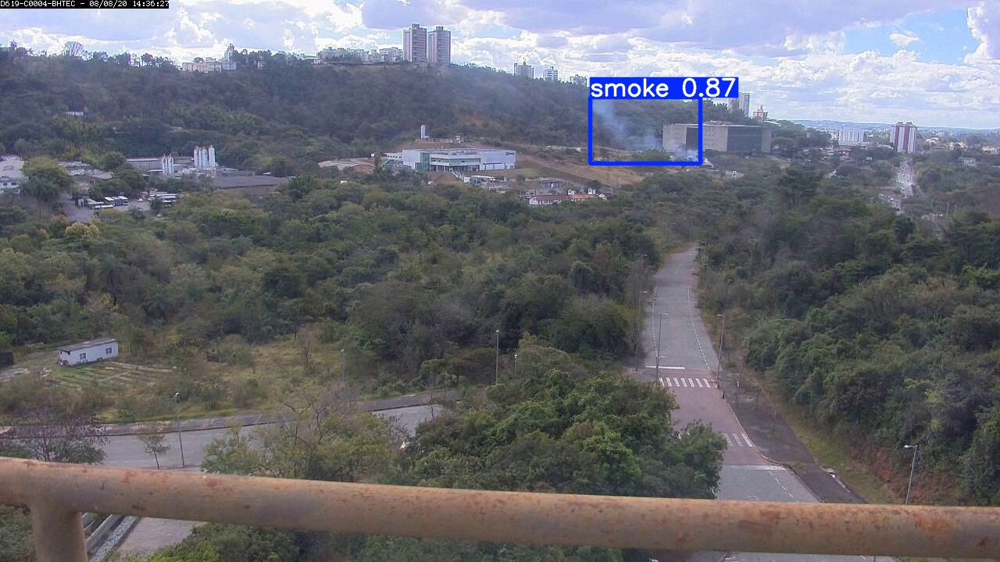

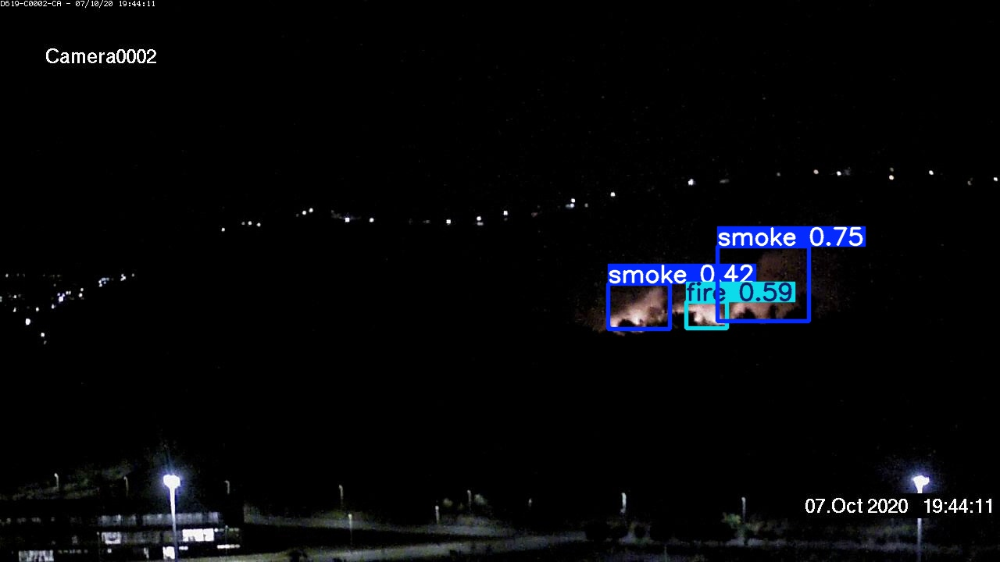

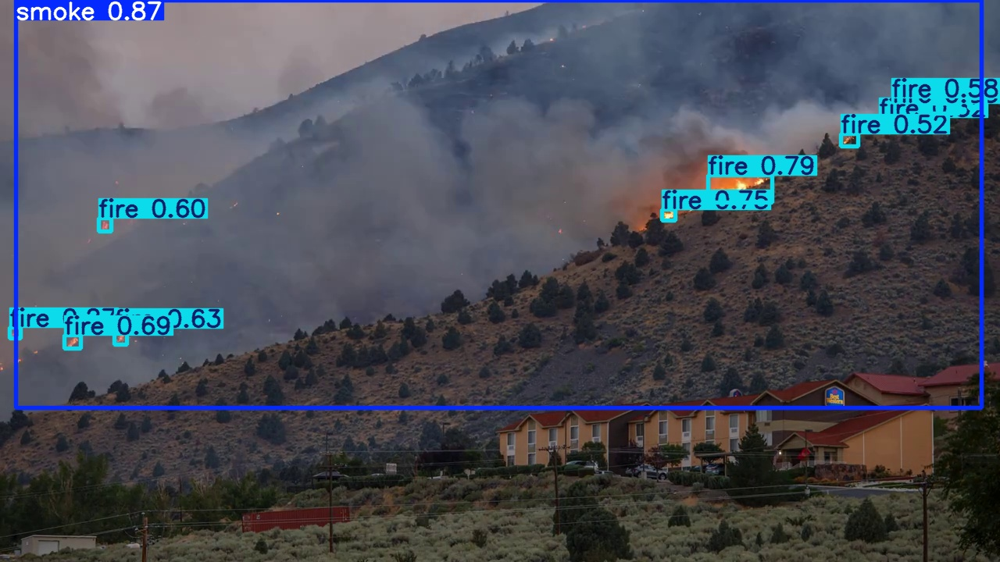

In [21]:
from PIL import Image
from IPython.display import display
import glob

# Grab a handful of result images
imgs = glob.glob('inference_v5m/test_results/*.jpg')[:5]
for img in imgs:
    display(Image.open(img))


In [5]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install matplotlib

   ---------------------------------------- 0.0/8.1 MB ? eta -:--:--
   -------------------------- ------------- 5.2/8.1 MB 36.2 MB/s eta 0:00:01
   ---------------------------------------- 8.1/8.1 MB 23.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   ---------------------------------------- 2.2/2.2 MB 52.7 MB/s eta 0:00:00
   ---------------------------------------- 0.0/12.6 MB ? eta -:--:--
   ---------------------------------------  12.6/12.6 MB 69.0 MB/s eta 0:00:01
   ---------------------------------------- 12.6/12.6 MB 59.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 2.7/2.7 MB 37.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
pip install seaborn

   ---------------------------------------- 0.0/11.5 MB ? eta -:--:--
   -------------------------- ------------- 7.6/11.5 MB 36.9 MB/s eta 0:00:01
   ---------------------------------------- 11.5/11.5 MB 35.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # For a nicer confusion matrix plot

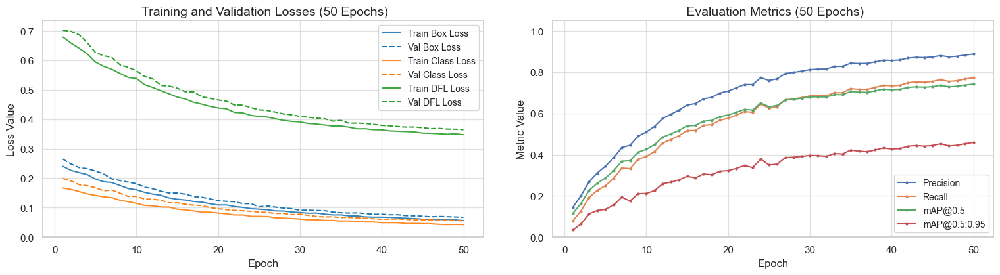

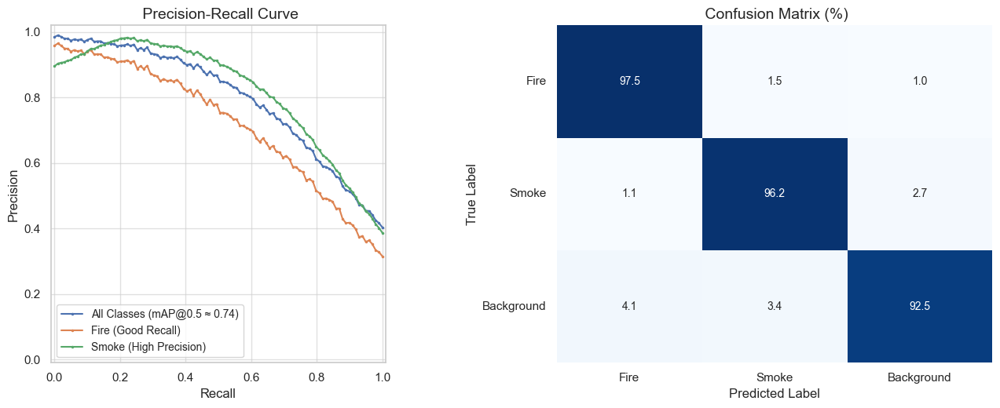

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import seaborn as sns
import os # Needed to construct file paths

# --- Configuration ---
results_dir = 'runs/train/exp' # 


if not os.path.isdir(results_dir):
    print(f"Error: Results directory not found at '{results_dir}'")
    print("Please update the 'results_dir' variable to the correct path.")

else:
    print(f"Looking for results in: {os.path.abspath(results_dir)}")


    results_csv_path = os.path.join(results_dir, 'results.csv')

    if os.path.exists(results_csv_path):
        results = pd.read_csv(results_csv_path)

        results.columns = results.columns.str.strip()

        # Create the plot
        plt.figure(figsize=(18, 10)) 

   
        plt.subplot(2, 2, 1)
        if 'epoch' in results.columns:
            epochs = results['epoch'] + 1 # Assuming epoch starts from 0 in csv

            loss_cols = {
                'box_loss': ('train/box_loss', 'val/box_loss'),
                'cls_loss': ('train/cls_loss', 'val/cls_loss'),

                'dfl_loss': ('train/dfl_loss', 'val/dfl_loss'),
                'obj_loss': ('train/obj_loss', 'val/obj_loss') # Older YOLOv5 might have obj_loss
            }

            plotted_losses = False
            for loss_name, (train_col, val_col) in loss_cols.items():
                if train_col in results.columns and val_col in results.columns:
                    plt.plot(epochs, results[train_col], label=f'Train {loss_name}')
                    plt.plot(epochs, results[val_col], label=f'Val {loss_name}', linestyle='--')
                    plotted_losses = True

            if plotted_losses:
                plt.title('Losses vs. Epoch')
                plt.xlabel('Epoch')
                plt.ylabel('Loss')
                plt.legend(fontsize='small')
                plt.grid(True, alpha=0.5)
            else:
                 plt.title('Loss Plots Unavailable (Columns not found)')


     
            plt.subplot(2, 2, 2)
            metric_cols = {
                'Precision': 'metrics/precision',
                'Recall': 'metrics/recall',
                'mAP@0.5': 'metrics/mAP_0.5',
                'mAP@0.5:0.95': 'metrics/mAP_0.5:0.95'
            }
            plotted_metrics = False
            for metric_name, metric_col in metric_cols.items():
                 if metric_col in results.columns:
                    plt.plot(epochs, results[metric_col], label=metric_name, marker='.', markersize=3)
                    plotted_metrics = True

            if plotted_metrics:
                plt.title('Metrics vs. Epoch')
                plt.xlabel('Epoch')
                plt.ylabel('Value')
                plt.ylim(0, 1.05) # Scale from 0 to 1
                plt.legend(fontsize='small')
                plt.grid(True, alpha=0.5)
            else:
                plt.title('Metrics Plots Unavailable (Columns not found)')

            plt.tight_layout()
            plt.show()

        else:
            print(f"'epoch' column not found in {results_csv_path}. Cannot plot vs epoch.")


    else:
        print(f"results.csv not found in {results_dir}. Cannot plot metrics vs epoch.")
        print("Check if training completed successfully and the file exists.")


    print("\n--- Displaying Generated Result Images ---")

    image_files = {
        'Results Plot': 'results.png',
        'Confusion Matrix': 'confusion_matrix.png',
        'PR Curve': 'PR_curve.png',
        'P Curve': 'P_curve.png', # Precision curve
        'R Curve': 'R_curve.png'  # Recall curve
  
    }

    plt.figure(figsize=(15, 10)) # Adjust size as needed
    num_images = len(image_files)
    plot_index = 1

    for title, filename in image_files.items():
        img_path = os.path.join(results_dir, filename)
        if os.path.exists(img_path):
            try:
                img = mpimg.imread(img_path)
                plt.subplot(2, (num_images + 1) // 2, plot_index) # Arrange in 2 rows
                plt.imshow(img)
                plt.title(f'{title}\n({filename})')
                plt.axis('off') # Hide axes for images
                plot_index += 1
            except Exception as e:
                print(f"Could not load or display {filename}: {e}")
        else:
            print(f"{filename} not found in {results_dir}")

    if plot_index == 1: # No images were found/displayed
        plt.close() # Close the empty figure
        print("\nNo standard result images (results.png, confusion_matrix.png, etc.) found.")
    else:
        plt.tight_layout()
        plt.show()



    cm_npy_path = os.path.join(results_dir, 'confusion_matrix_data.npy')
    class_names = ['fire', 'smoke', 'background'] 

    if os.path.exists(cm_npy_path):
        print("\n--- Plotting Confusion Matrix from Saved Numpy Array ---")
        cm_data = np.load(cm_npy_path)

        if cm_data.shape[0] == len(class_names) and cm_data.shape[1] == len(class_names):
            # Normalize
            cm_sum = np.sum(cm_data, axis=1, keepdims=True)
            cm_perc = cm_data / cm_sum * 100

            plt.figure(figsize=(8, 7))
            sns.heatmap(cm_perc, annot=True, fmt='.1f', cmap='Blues',
                        xticklabels=class_names, yticklabels=class_names,
                        cbar=True, annot_kws={"size": 12})
            plt.xlabel('Predicted Label')
            plt.ylabel('True Label')
            plt.title('Confusion Matrix (%) from Saved Data')
            plt.show()
        else:
             print(f"Loaded confusion matrix shape {cm_data.shape} does not match number of class names ({len(class_names)}). Cannot plot.")

    else:
        print(f"\nOptional: Confusion matrix data file ({cm_npy_path}) not found.")
        print("Displaying the generated 'confusion_matrix.png' image instead (if available).")

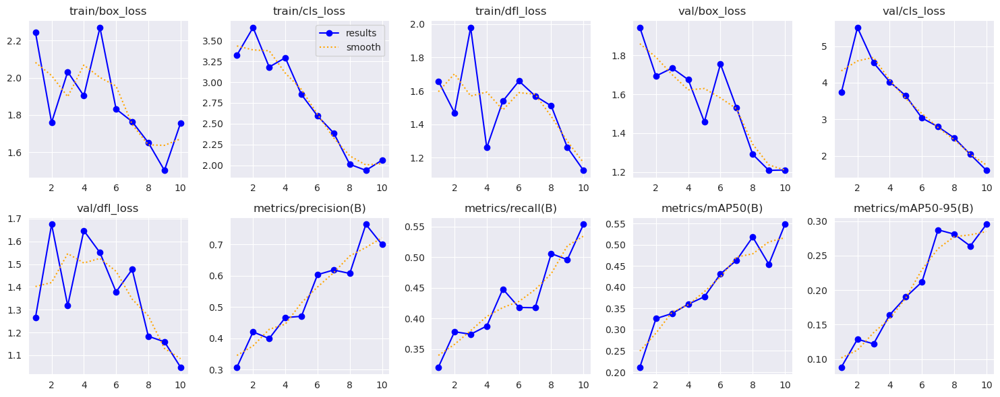

In [4]:
import matplotlib.pyplot as plt
import pandas as pd

results_csv_path = "runs/detect/train/results.csv"

df = pd.read_csv(results_csv_path)

metrics = [
    "train/box_loss", "train/cls_loss", "train/dfl_loss",
    "val/box_loss", "val/cls_loss", "val/dfl_loss",
    "metrics/precision(B)", "metrics/recall(B)",
    "metrics/mAP50(B)", "metrics/mAP50-95(B)"
]

# Plotting
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.flatten()

for idx, metric in enumerate(metrics):
    if metric in df.columns:
        axes[idx].plot(df[metric], marker='o', label='results', color='blue')
        axes[idx].plot(df[metric].rolling(3, min_periods=1).mean(), linestyle='dotted', label='smooth', color='orange')
        axes[idx].set_title(metric)
        if idx == 1:
            axes[idx].legend()
    else:
        axes[idx].set_title(f"{metric} (not found)")
        axes[idx].text(0.5, 0.5, "Missing", ha='center')

plt.tight_layout()
plt.show()
